In [ ]:
%load_ext autoreload
%autoreload 2
import sys

sys.path.append("..")
from src import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# [TeD](https://github.com/BoomLab-wlee/TeD)
TeD introduces a temporal-gradient (TG) based strategy that identifies, at each pixel, how temporal redundancy can be used. A smoothed TG is computed and accumulated between neighboring frames. Then, during training, TeD employs self-supervised learning similar to Noise2Noise. Two pixels with highly correlated TG values, but independent noise form input-target pairs. Finally, a TG attention module ingests the cumulative TG and guides the denoising process.

## 1. Modest input SNR
Here we use the checkpoint (`TeD_naomi`) provided by the authors.

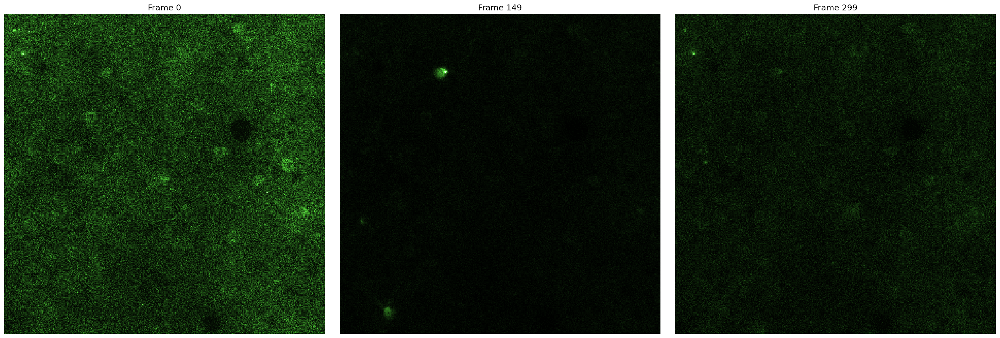

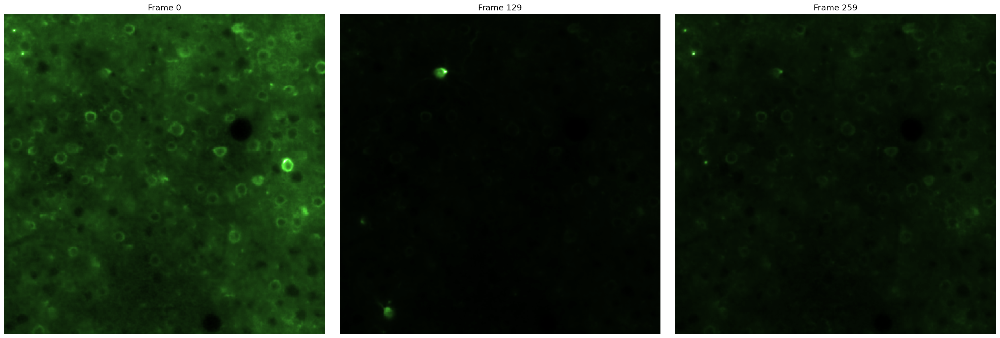

In [ ]:
max_frames = 600
frame = 100
meta = DATASETS["synthetic"]
x = Recording(meta.x, max_frames=max_frames)
gt = Recording(meta.gt, max_frames=max_frames)
y = Recording(meta.dir / "ted.tif", max_frames=max_frames)
imshow([x[frame], y[frame], gt[frame]])

Results are quite good

## 2. Low input SNR
### 2.1. Using pretrained checkpoint
This time we use the pretrained checkpoint (`TeD_naomi`) on the noisiest version of the synthetic dataset. This is the version used throughout all the experiments.

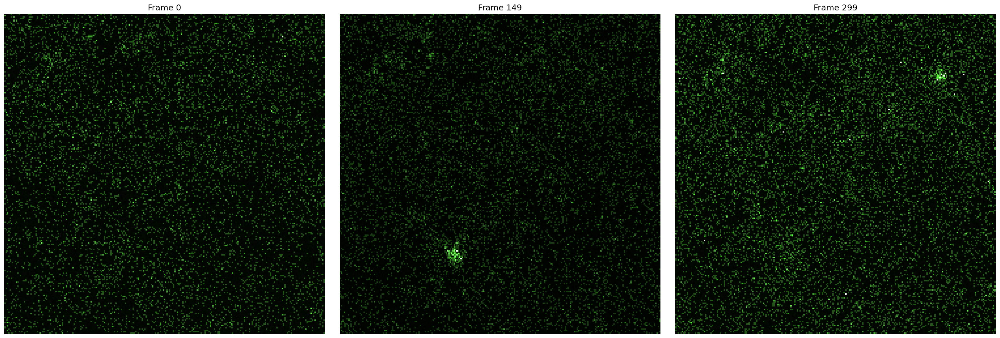

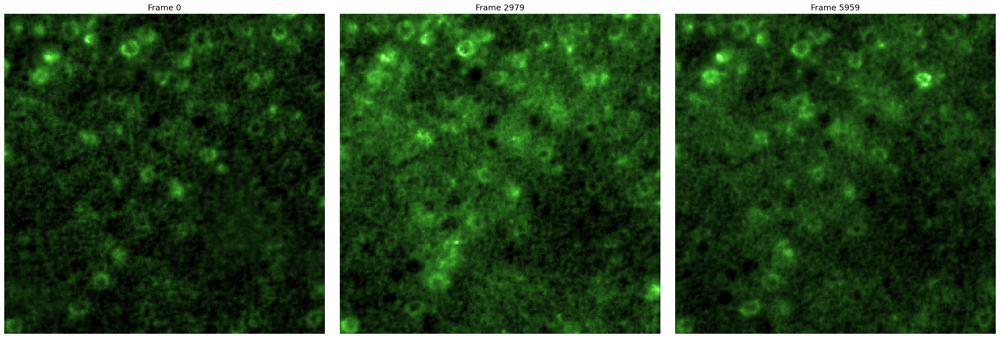

In [30]:
x = Recording("data/synthetic/x.tif", max_frames=300)
y = Recording(DATASETS["synthetic"].dir/"ted.tif", max_frames=None)
x.preview(row=1, zoom=2)
y.preview(row=1, zoom=2)

Results arev visisbly worse than DeepCAD-RT's

### 2.2. Training TeD from scratch
This time we first ran the training using the `train.py` script using the noisiest version as input (note that the training is self-supervised) and then ran the test with the learned model.

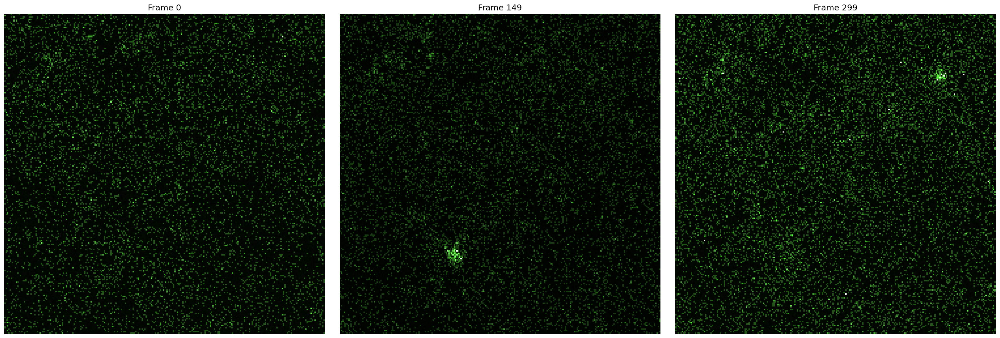

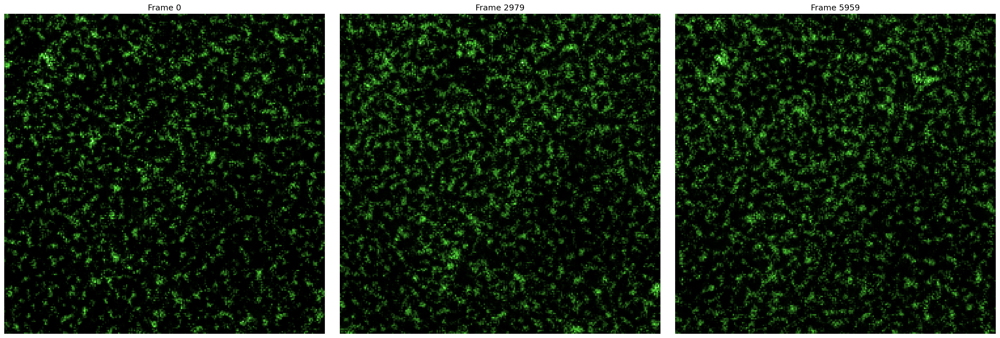

In [34]:
x = Recording("data/synthetic/x.tif", max_frames=300)
y = Recording("results/images/synthetic/synthetic_epoch_149/x.tif", max_frames=None)
x.preview(row=1, zoom=2)
y.preview(row=1, zoom=2)

The results are horrible 🙈 

Perhaps TeD is designed to work with inputs that are not too noisy.

## 3. TeD on non-synthetic dataset
This is one of the 2 non-synthetic results provided by the authors.

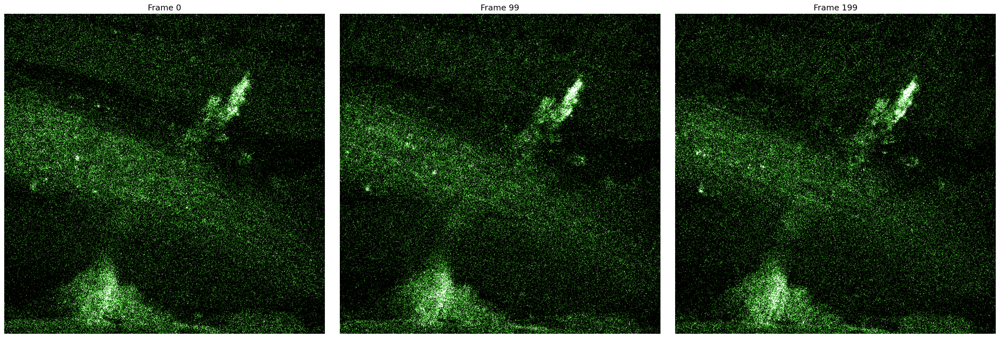

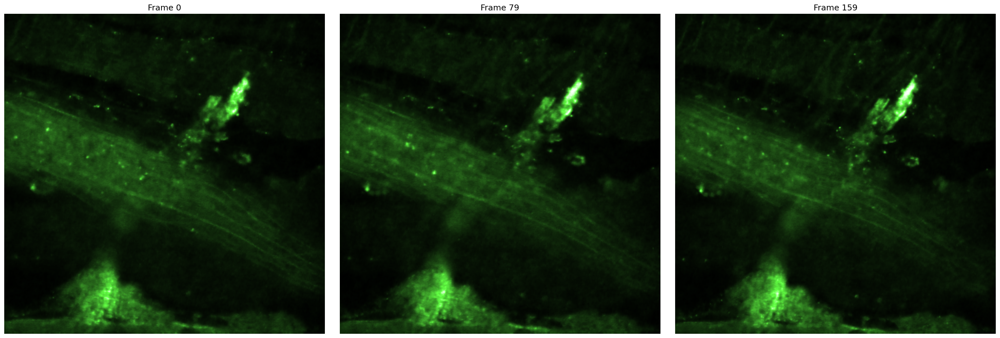

In [27]:
x = Recording("data/invivo_vascular/venule_images_in_the_cremaster_muscle_ch1.tif", max_frames=None)
y = Recording("results/images/TeD_invivo_vascular/invivo_vascular_epoch_149/venule_images_in_the_cremaster_muscle_ch1.tif", max_frames=None)
x.preview(row=1)
y.preview(row=1)